# Main set up
- Import necessary libraries
- Set global variables

In [1]:
import os
import sys
import shutil
import random
import matplotlib.pyplot as plt
import cv2
import numpy as np
import datetime
import tensorflow as tf
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Conv2D, BatchNormalization, ReLU
from tensorflow.keras.layers import MaxPooling2D, Dense, Dropout, LeakyReLU
from tensorflow.keras.layers import UpSampling2D, concatenate, Dropout
from tensorflow.keras.layers import Layer, Concatenate, Add, Conv2DTranspose
from tensorflow.keras.optimizers import Adam, SGD
from tensorflow.keras.callbacks import EarlyStopping, TensorBoard, Callback
from tensorflow.keras.callbacks import ModelCheckpoint, ReduceLROnPlateau
from tensorflow.keras.regularizers import l2
from tensorflow.keras.utils import plot_model
from scipy import ndimage
from sklearn.cluster import KMeans
from sklearn.metrics import roc_curve, balanced_accuracy_score
from mpl_toolkits.mplot3d import Axes3D
from IPython.display import clear_output

%load_ext tensorboard

np.set_printoptions(threshold=sys.maxsize)

train_dir = "/content/drive/MyDrive/datasets/cityscapes/train"
val_dir = "/content/drive/MyDrive/datasets/cityscapes/val"
test_dir = "/content/drive/MyDrive/datasets/cityscapes/test"
checkpoint_path = "/content/drive/MyDrive/weights/autonomous_driving/erf_net.h5"

train_size = None
val_size = None
test_size = None

num_samples = 5
image_size = 256

print("setup complete")

setup complete


# Initial requirements
- Download the dataset from kaggle
- Shuffle and split into train and test directories
- Move final dataset to drive

In [2]:
# # upload kaggle.json file and install kaggle
# ! pip install kaggle
# ! mkdir ~/.kaggle
# ! cp kaggle.json ~/.kaggle
# ! chmod 600 ~/.kaggle/kaggle.json

# # download the dataset
# ! kaggle datasets download -d dansbecker/cityscapes-image-pairs
# ! unzip /content/cityscapes-image-pairs.zip

# # make new directories
# os.mkdir("cityscapes")
# os.mkdir("./cityscapes/train")
# os.mkdir("./cityscapes/test")

# # move the validation set as is
# ! mv /content/cityscapes_data/val ./cityscapes

In [3]:
train_src_dir = "/content/cityscapes_data/train"
train_dest_dir = "/content/cityscapes/train"
test_dest_dir = "/content/cityscapes/test"

def get_file_paths(root_dir):
  '''
  Function to fetch a list of complete file paths of all file in a given directory
  Parameters:
    root_dir => directory from which we need the files
  Returns:
    files => list of file paths
  '''
  files = [os.path.join(root_dir, file_name) for file_name in os.listdir(root_dir)]
  return files

def split(data, split_size):
  '''
  Function to split data
  Parameters:
    data => list of file paths
    split_size => size of right split
  Returns:
    left, right => the two splits
  '''
  random.shuffle(data)
  left = data[ : -split_size]
  right = data[ -split_size : ]
  return left, right

def move_files(file_paths, dest_dir):
  '''
  Function to copy files to a given directory
  Parameters:
    file_paths => list of full file paths
    dest_dir => destination directory of the transfer
  '''
  for file in file_paths:
    shutil.copy(file, dest_dir)
  print(f"Moved files to {dest_dir}")

# val_size = len(os.listdir("/content/cityscapes/val"))
# test_size = val_size
# train_files, test_files = split(get_file_paths(train_src_dir), test_size)
# move_files(train_files, train_dest_dir)
# move_files(test_files, test_dest_dir)

# ! mv /content/cityscapes /content/drive/MyDrive/datasets

# Step 1
- View samples
- Split image from mask
- Cluster different colors and reassign classes. Compressed images in the dataset are such that not all pixels have values that belong to some class (they have some intermediate value).
- Visualize new masks
- Convert RGB masks to classes

In [4]:
# get train, val and test sizes
train_size = len(os.listdir(train_dir))
val_size = len(os.listdir(val_dir))
test_size = len(os.listdir(test_dir))

print(f"Train size : {train_size}")
print(f"Val size : {val_size}")
print(f"Test size : {test_size}")

Train size : 2475
Val size : 500
Test size : 500


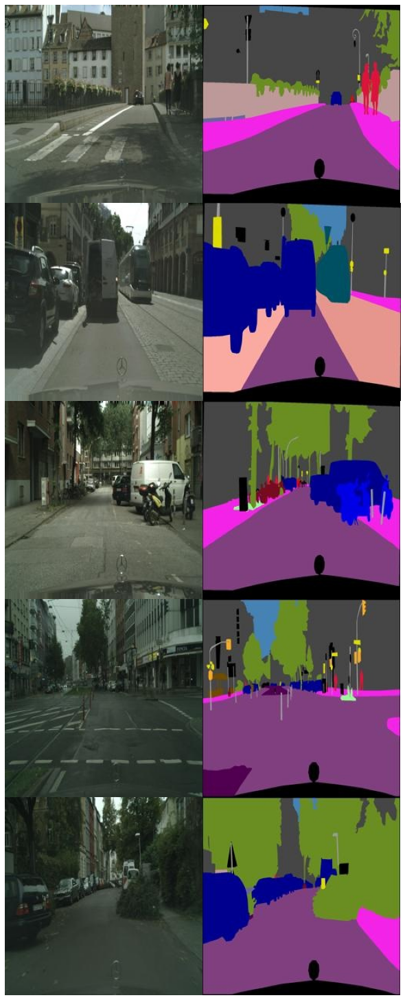

In [5]:
def show_samples(root_dir, num_samples):
  '''
  Function to display sample images
  Parameters:
    root_dir => directory where samples are present
    num_samples => number of samples to be displayed
  '''
  fig, axes = plt.subplots(5, 1, figsize = (10, 20))
  axes.ravel()
  for file, ax in zip(os.listdir(root_dir)[ : num_samples], axes):
    file_path = os.path.join(root_dir, file)
    image = cv2.imread(file_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    ax.imshow(image)
    ax.axis('off')
  fig.tight_layout(pad = 0)

show_samples(train_dir, num_samples)

(-0.5, 255.5, 255.5, -0.5)

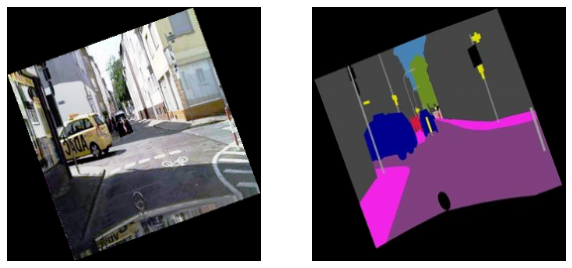

In [6]:
def split_image_mask(file_path, rotation = 0, flip = False):
  '''
  Function to split a file into image and mask, add augmentation
  Parameters:
    file_path => path of the file
    rotation => degree of rotation of image, mask
    flip => flip the image, mask through y axis
  '''
  file = cv2.imread(file_path)
  file = cv2.cvtColor(file, cv2.COLOR_BGR2RGB)

  image = file[:, 0:image_size, :]
  mask = file[:, image_size:, :]

  # increase contrast of each color
  for channel in range(3):
    og = image[:, :, channel]
    high_contrast = cv2.equalizeHist(og)
    image[:, :, channel] = high_contrast
  
  image = ndimage.rotate(image, rotation)
  mask = ndimage.rotate(mask, rotation)

  if flip:
    image = cv2.flip(image, 1)
    mask = cv2.flip(mask, 1)
  
  image = cv2.resize(image, (image_size, image_size))
  mask = cv2.resize(mask, (image_size, image_size))

  image = image/255.0
  mask = mask/255.0

  return image, mask

# EXAMPLE
image, mask = split_image_mask("/content/drive/MyDrive/datasets/cityscapes/val/1.jpg", -20, True)
fig, axes = plt.subplots(1, 2, figsize = (10, 5))
axes.ravel()
axes[0].imshow(image)
axes[0].axis('off')
axes[1].imshow(mask)
axes[1].axis('off')

In [7]:
def get_colors(root_dir, num_samples):
  '''
  Function to get a sample of various colors in the masks
  Parameters:
    root_dir => directory where image, masks are located
    num_samples => number of images to sample for colors
  Returns:
    colors => numpy array of RGB values from the masks
  '''
  file_names = get_file_paths(root_dir)[: num_samples]
  colors = []
  for file in file_names:
    _, mask = split_image_mask(file)
    mask = mask.reshape((mask.shape[0] * mask.shape[1], 3))
    colors.append(mask)
  colors = np.asarray(colors)
  colors = colors.reshape((colors.shape[0] * colors.shape[1], 3))
  return colors

colors = get_colors(train_dir, 2*num_samples)
print(colors.shape)

(655360, 3)


Text(0.5, 0.92, 'Clustering of colors')

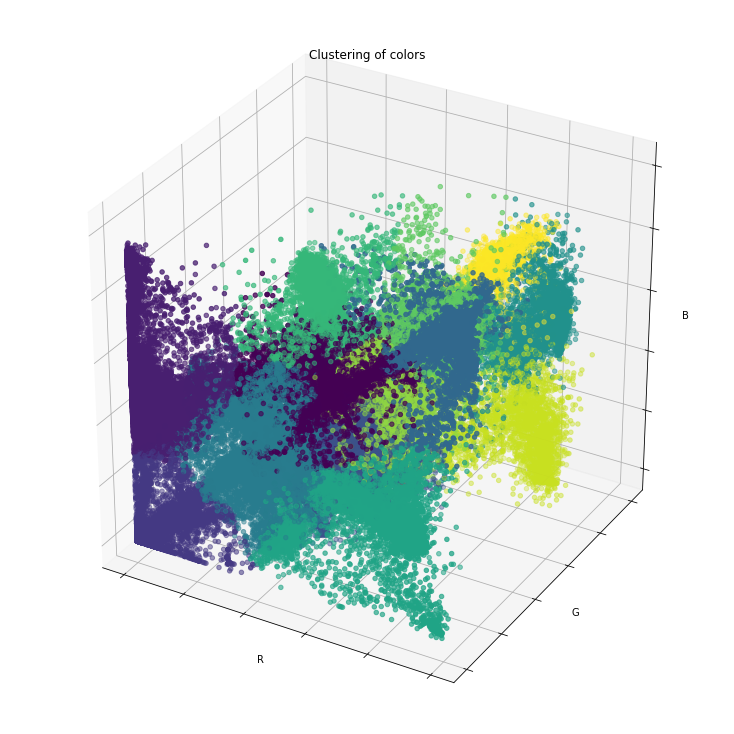

In [8]:
# cluster the colors into new classes
kmeans = KMeans(13, random_state=42)
kmeans.fit(colors)
labels = kmeans.labels_

# visualize clusters
fig = plt.figure(1, figsize = (10, 10))
ax = Axes3D(fig)
# R, G, B
ax.scatter(colors[:, 0], colors[:, 1], colors[:, 2], c = labels.astype('float'))
# remove ticks, set axis name
ax.w_xaxis.set_ticklabels([])
ax.set_xlabel("R")
ax.w_yaxis.set_ticklabels([])
ax.set_ylabel("G")
ax.w_zaxis.set_ticklabels([])
ax.set_zlabel("B")
ax.set_title('Clustering of colors')

In [9]:
def mask_to_rgb(mask):
  '''
  Function to visualize the result of reassigning class colors
  after k means on some mask
  Parameters:
    mask => numpy array of (256, 256, num_classes)
  Returns:
    rgb => rgb image that results from coloring the mask
  '''
  colors = [(255,0,0), (0,255,0), (0,0,255),
            (255,255,0), (255,0,255), (0,255,255),
            (255,255,255), (200,50,0),(50,200,0),
            (50,0,200), (200,200,50), (0,50,200),
            (0,200,50), (0,0,0)]
  
  rgb = np.zeros((mask.shape[0], mask.shape[1], 3))

  for class_ in range(mask.shape[2]):
    class_mask = mask[:, :, class_]
    color = colors[class_]

    for c in range(3):
      rgb[:, :, c] += color[c] * class_mask
  
  rgb = rgb/255.0
  return rgb

print("mask_to_rgb setup")

mask_to_rgb setup


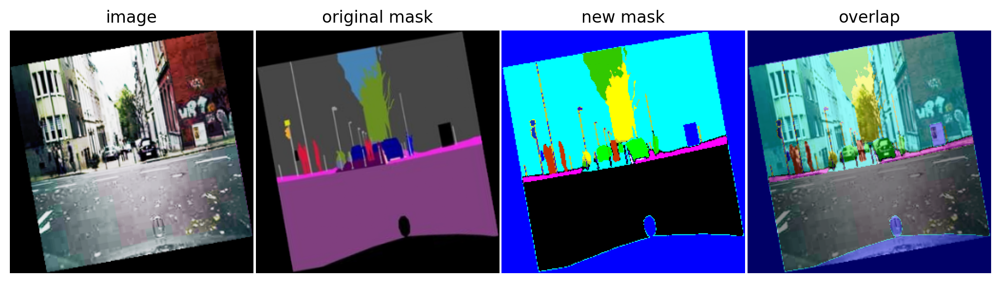

In [10]:
def rgb_to_mask(img):
  '''
  Function to convert original rgb masks to class masks
  Parameters:
    img => numpy array of rgb mask (256, 256, 3)
  Returns:
    mask => numpy array of mask (256, 256, num_classes)
  '''
  img_unroll = img.reshape((img.shape[0] * img.shape[1], 3)) # (65536, 3)

  num_classes = len(kmeans.cluster_centers_) # 13
  classes_unroll = kmeans.predict(img_unroll) # (65536, )
  classes = classes_unroll.reshape((img.shape[0], img.shape[1])) #(256, 256)

  mask = np.zeros((classes.shape[0], classes.shape[1], num_classes)) #(256, 256, 13)

  for class_ in range(num_classes):
    m = np.copy(classes)
    m[ m != class_ ] = 0
    m[ m != 0 ] = 1
    mask[:, :, class_] = m
  
  return mask

# EXAMPLE
# get original image, mask
# get class mask from original mask
# create an overlap
# visualize new rgb mask from class mask
img, og_mask = split_image_mask("/content/drive/MyDrive/datasets/cityscapes/train/10.jpg", rotation=10, flip=False)
class_mask = rgb_to_mask(og_mask)
new_mask = mask_to_rgb(class_mask)
overlap = cv2.addWeighted(img, 0.6, new_mask, 0.4, 0)

images = [img, og_mask, new_mask, overlap]
titles = ['image', 'original mask', 'new mask', 'overlap']

fig, axes = plt.subplots(1, 4, figsize = (10, 10), dpi = 200)
axes.ravel()

for pic, title, ax in zip(images, titles, axes):
  ax.imshow(pic)
  ax.axis('off')
  ax.set_title(title)

fig.tight_layout(pad = 0.2)

# Step 2
- Create generator

In [11]:
def Generator(dir_path = train_dir, max_rotation = 10, batch_size = 10):
  '''
  Generator function creates batches of 10 images and mask augmented
  through random rotation and horizontal flip of a randomly selected
  image from train directory. Typical python generator. 

  Parameters:
    dir_path => directory where images are located
    max_rotation => maximum angle of rotation
    batch_size => batch size
  Yields:
    imgs => numpy array of images (batch_size, img_size, img_size, 3)
    masks => numpy array of class masks (batch_size, img_size, img_size, num_classes)
  '''
  files = os.listdir(dir_path)

  # technically an infinite loop, but it 
  # isn't called after all epochs are done
  while True:
    imgs = []
    masks = []

    # pick "batch_size" number of augmented images
    for i in range(batch_size):
      file = random.choice(files)
      file_path = os.path.join(dir_path, file)
      flip = False
      if random.random() > 0.5 : flip = True
      rotation = max_rotation * (2*random.random() - 1)
      img, rgb_mask = split_image_mask(file_path, rotation, flip)
      class_mask = rgb_to_mask(rgb_mask)
      imgs.append(img)
      masks.append(class_mask)
    
    # return the imgs and masks, continue execution
    yield np.array(imgs), np.array(masks)

# EXAMPLE
gen = Generator()
imgs, masks = next(gen) # fetch next set of imgs, masks
fig, axes = plt.subplots(10, 2, figsize = (4, 20), dpi = 150)
for img, mask, row in zip(imgs, masks, axes):
  row[0].imshow(img)
  row[0].axis('off')

  rgb_mask = mask_to_rgb(mask)
  
  row[1].imshow(rgb_mask)
  row[1].axis('off')

fig.tight_layout(pad = 0.25)

Output hidden; open in https://colab.research.google.com to view.

In [12]:
# create train and val generators
train_gen = Generator()
val_gen = Generator(dir_path=val_dir)
print("Generators made")

Generators made


# Step 3
- Build model
- Create callbacks

<p align = "center">
  <img src = "https://miro.medium.com/max/1228/1*4ps4BY8WtKA3sbYONakV6g.png" alt = "erfnet_architecture">
</p>

In [13]:
class DownsamplerBlock(Layer):
  def __init__(self, ch_in, ch_out):
    super(DownsamplerBlock, self).__init__()
    self.conv = Conv2D(filters = ch_out - ch_in, kernel_size = 3, strides = 2, padding = 'same')
    self.pool = MaxPooling2D(pool_size = 2, strides = 2)
    self.bn = BatchNormalization()
  
  def call(self, input):
    out1 = self.conv(input)
    out2 = self.pool(input)
    out = Concatenate(axis = -1)([out1, out2])
    out = self.bn(out)
    return out

<p align = "center">
  <img src = "https://miro.medium.com/max/1148/1*rub-Ftiz1rF3XsaIjvzZVg.png" alt = "bottlenecks">
</p>

In [14]:
class NonBottleNeck1D(Layer):
  def __init__(self, ch_out, dropout_rate, dilation_rate):
    super(NonBottleNeck1D, self).__init__()
    self.dropout_rate = dropout_rate
    self.conv1 = Conv2D(filters = ch_out, kernel_size = (3, 1), strides = 1, padding = 'same')
    self.conv2 = Conv2D(filters = ch_out, kernel_size = (1, 3), strides = 1, padding = 'same')
    self.bn1 = BatchNormalization()
    self.conv3 = Conv2D(filters = ch_out, kernel_size = (3, 1), strides = 1, padding = 'same', dilation_rate = (dilation_rate, 1))
    self.conv4 = Conv2D(filters = ch_out, kernel_size = (1, 3), strides = 1, padding = 'same', dilation_rate = (1, dilation_rate))
    self.bn2 = BatchNormalization()
    if(self.dropout_rate):
      self.dropout = Dropout(rate = self.dropout_rate)
  
  def call(self, inputs, training = True):
    out = self.conv1(inputs)
    out = ReLU()(out)
    out = self.conv2(out)
    out = self.bn1(out, training = training)
    out = ReLU()(out)
    out = self.conv3(out)
    out = ReLU()(out)
    out = self.conv4(out)
    out = self.bn2(out)
    if(self.dropout_rate):
      out = self.dropout(out, training = training)
    out = Add()([out, inputs])
    out = ReLU()(out)
    return out

In [15]:
class UpsamplerBlock(Layer):
  def __init__(self, ch_out):
    super(UpsamplerBlock, self).__init__()
    self.conv = Conv2DTranspose(filters = ch_out, kernel_size = 3, strides = 2, padding = 'same')
    self.bn = BatchNormalization()
  
  def call(self, inputs):
    out = self.conv(inputs)
    out = self.bn(out)
    out = ReLU()(out)
    return out

In [16]:
class Encoder(Model):
  def __init__(self):
    super(Encoder, self).__init__()
    # Layer 1
    self.initial_block = DownsamplerBlock(ch_in = 3, ch_out = 16)
    
    self.blocks = []
    # Layer 2
    self.blocks.append(DownsamplerBlock(ch_in = 16, ch_out = 64))
    # Layer 3 to 7
    for _ in range(5):
      self.blocks.append(NonBottleNeck1D(ch_out = 64, dropout_rate=0.03, dilation_rate=1))
    
    # Layer 8
    self.blocks.append(DownsamplerBlock(ch_in = 64, ch_out = 128))
    # Layer 9 to 16
    for _ in range(2):
      self.blocks.append(NonBottleNeck1D(ch_out = 128, dropout_rate = 0.3, dilation_rate = 2))
      self.blocks.append(NonBottleNeck1D(ch_out = 128, dropout_rate = 0.3, dilation_rate = 4))
      self.blocks.append(NonBottleNeck1D(ch_out = 128, dropout_rate = 0.3, dilation_rate = 8))
      self.blocks.append(NonBottleNeck1D(ch_out = 128, dropout_rate = 0.3, dilation_rate = 16))
  
  def call(self, inputs, training = True):
    out = self.initial_block(inputs)
    for block in self.blocks:
      out = block(out, training = training)
    return out

In [17]:
class Decoder(Model):
  def __init__(self, num_classes):
    super(Decoder, self).__init__()
    self.blocks = []
    # Layer 17
    self.blocks.append(UpsamplerBlock(ch_out = 64))
    # Layer 18 and 19
    self.blocks.append(NonBottleNeck1D(ch_out = 64,dropout_rate=0, dilation_rate=1))
    self.blocks.append(NonBottleNeck1D(ch_out = 64,dropout_rate=0, dilation_rate=1))
    # Layer 20
    self.blocks.append(UpsamplerBlock(ch_out = 16))
    # Layer 21 and 22
    self.blocks.append(NonBottleNeck1D(ch_out = 16, dropout_rate = 0, dilation_rate = 1))
    self.blocks.append(NonBottleNeck1D(ch_out = 16, dropout_rate = 0, dilation_rate = 1))
    # Layer 23
    self.output_conv = Conv2DTranspose(filters = num_classes, kernel_size = 2, strides = 2, padding = 'same')
  
  def call(self, inputs, training = True):
    out = inputs 
    for block in self.blocks:
      out = block(out, training = training)
    out = self.output_conv(out)
    return out

In [18]:
class ERFNet(Model):
  def __init__(self, num_classes):
    super(ERFNet, self).__init__()
    self.encoder = Encoder()
    self.decoder = Decoder(num_classes = num_classes)
  
  def call(self, inputs, training = True):
    out = self.encoder(inputs, training = training)
    out = self.decoder(out, training = training)
    return out

In [19]:
model = ERFNet(num_classes=13)
model.build(input_shape = (None, 256, 256, 3))
optimizer = Adam(learning_rate=1e-4)
model.compile(optimizer=optimizer, loss = 'categorical_crossentropy', metrics = ['accuracy'])
model.summary()

Model: "erf_net"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 encoder (Encoder)           multiple                  1879836   
                                                                 
 decoder (Decoder)           multiple                  190557    
                                                                 
Total params: 2,070,393
Trainable params: 2,063,801
Non-trainable params: 6,592
_________________________________________________________________


In [20]:
class display_progress_callback(Callback):
  '''
  Tensorflow callback class to display
  model predictions at regular intervals
  '''
  def __init__(self, interval = 50, sample_image = "/content/drive/MyDrive/datasets/cityscapes/val/1.jpg"):
    '''
    Constructor class
    Parameters:
      interval => epoch intervals at which predictions are displayed
      sample_image => sample image||mask file path
    '''
    super(display_progress_callback, self).__init__()
    self.interval = interval
    self.sample_image = sample_image
  
  def on_epoch_end(self, epoch, logs = None):
    '''
    Function to display intermediate predictions
    '''
    if (epoch+1) % self.interval : return
    
    clear_output(wait = True)
    
    print(f"sample prediction after epoch {epoch + 1}")
    
    img, mask = split_image_mask(self.sample_image)
    img = img.reshape((1, img.shape[0], img.shape[1], img.shape[2])) # reshape img to (1, 256, 256, 3)
    
    class_mask = rgb_to_mask(mask)
    new_mask = mask_to_rgb(class_mask)
    
    pred_class_mask = self.model.predict(img) # pred has shape (1, 256, 256, 13)
    img = img.reshape(((img.shape[1], img.shape[2], img.shape[3]))) # reshape img back to (256, 256, 3)
    
    # reshape prediction to (256, 256, 13)
    pred_class_mask = pred_class_mask.reshape((pred_class_mask.shape[1], pred_class_mask.shape[2], pred_class_mask.shape[3]))
    pred_mask = mask_to_rgb(pred_class_mask)

    # plot ground truth and prediction
    fig, axes = plt.subplots(1, 2, figsize = (10, 10))
    
    axes[0].imshow(new_mask)
    axes[0].axis('off')
    
    axes[1].imshow(pred_mask)
    axes[1].axis('off')
    
    fig.tight_layout(pad = 0.1)
    plt.show()

print("created custom callback class")

created custom callback class


In [25]:
def make_callbacks():
  '''
  Function to make callbacks for the model. These are
  1. reduce lr on plateau
  2. checkpoint saver
  3. early stopping
  4. tensorboard
  5. display progress (custom)
  Returns:
    callbacks => list of callbacks
  '''
  reduce_lr = ReduceLROnPlateau(monitor='val_accuracy', patience=25, factor = 0.3, min_lr = 1e-7, verbose = 1)  
  
  early_stopping = EarlyStopping(monitor='val_accuracy', patience=50, restore_best_weights=True)

  log_dir = "logs/fit" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
  tensorboard_callback = TensorBoard(log_dir=log_dir, histogram_freq=0)

  display_progress = display_progress_callback()

  callbacks = [early_stopping, tensorboard_callback, display_progress]

  return callbacks

callbacks = make_callbacks()
print("callbacks made")

callbacks made


In [27]:
model.save_weights(checkpoint_path)

# Step 4a
- Train model

In [ ]:
# clear old logs
! rm -rf ./logs/
history = model.fit(
    train_gen,
    epochs=10,
    steps_per_epoch=10,
    validation_data=val_gen,
    validation_steps=10,
    callbacks=callbacks,
    verbose = 2
)

# Step 4b
- Load the model

In [29]:
model.load_weights(checkpoint_path)
print("model loaded")

model loaded


# Step 5
- Evaluate model
- Run tensorboard
- Plot ROC curves for individual classes
- Plot balanced accuracy scores

In [ ]:
%tensorboard --logdir /content/logs/fit20220223-111810

In [ ]:
# evaluate model loss and accuracy
test_gen = Generator(test_dir)
perf = model.evaluate(test_gen, steps = 5, return_dict=True)
for metric in perf.keys():
  print(f"{metric} : {perf[metric]}")

In [ ]:
# visualize some predictions
for imgs, masks in test_gen:
  preds = model.predict(imgs)
  for i in range(min(preds.shape[0], 2*num_samples)):
    og_mask = mask_to_rgb(masks[i])
    pred_mask = mask_to_rgb(preds[i])

    og_total = cv2.addWeighted(imgs[i], 0.6, og_mask, 0.4, 0)
    pred_total = cv2.addWeighted(imgs[i], 0.6, pred_mask, 0.4, 0)
    
    fig, axes = plt.subplots(1, 2, figsize = (10, 10))
    axes[0].imshow(og_mask)
    axes[0].axis('off')
    axes[0].set_title('ground truth')

    axes[1].imshow(pred_mask)
    axes[1].axis('off')
    axes[1].set_title('predicted')

    fig.tight_layout(pad = 0.1)
    fig.show()
  # break here for just one batch
  break

In [ ]:
# balanced accuracy score over each class
bas = []

# plot ROC curve for each class
for imgs, masks in test_gen:
  preds = model.predict(imgs)
  fig, axes = plt.subplots(4, 4, figsize = (10, 10))
  axes = axes.ravel()
  for class_, ax in zip(range(preds.shape[-1]), axes):
    fpr, tpr, thresholds = roc_curve(masks[:, :, :, class_].ravel(), preds[:, :, :, class_].ravel())
    
    pred = np.round(preds[:, :, :, class_].ravel()).astype(np.int32)
    class_bas = balanced_accuracy_score(masks[:, :, :, class_].ravel(), pred)
    bas.append(class_bas)
    
    ax.plot(fpr, tpr)
    ax.set_title(f"Class {class_}")
    ax.set_xlabel("False Positive Rate")
    ax.set_ylabel("True Positive Rate")
  fig.tight_layout()
  break

In [ ]:
# bar graph of balanced accuracy class
plt.figure(figsize = (10, 10))
plt.bar(np.arange(0, len(bas)), bas)
plt.xticks(np.arange(0, len(bas)))
plt.xlabel("Class")
plt.ylabel("Balanced accuracy")
plt.show()